# Python Intro 3: Images and NumPy

## Pillow (PIL)

Pillow (a fork of PIL) is a library for image manipulation.

See [readthedocs.io](https://pillow.readthedocs.io/en/stable/handbook/tutorial.html) and [automate the boring stuff](https://automatetheboringstuff.com/chapter17/) for more.

In [49]:
from PIL import Image # = pillow (conda install pillow).
from IPython.display import display

### Load an image

In [2]:
# Create an Image object
img = Image.open('images/Fig24.png')

Inspect the file:

In [3]:
print('size:', img.size)
print('mode:', img.mode)
print('format:', img.format)

size: (512, 512)
mode: RGB
format: PNG


Display the image with the built-in IPython.display() function:

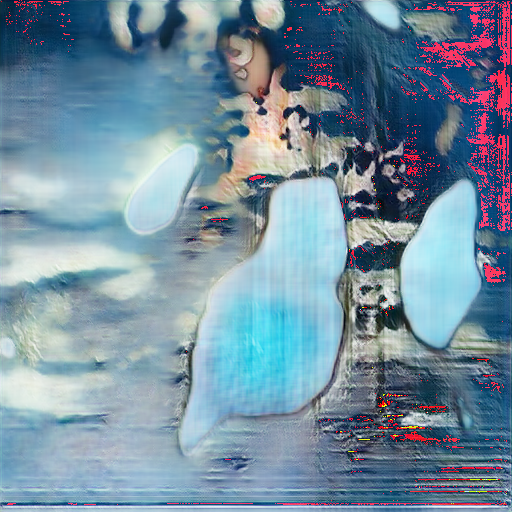

In [4]:
display(img)

### Geometrical transformations

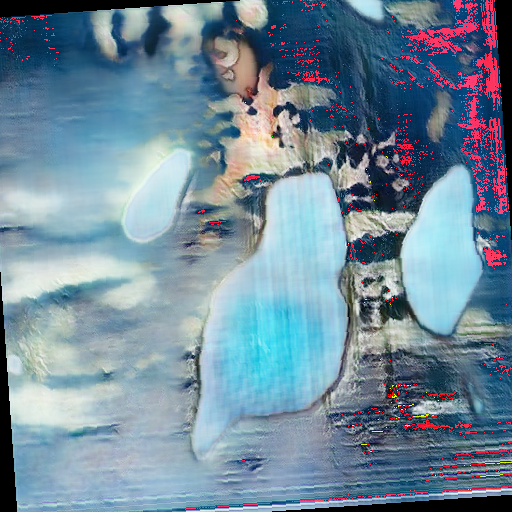

In [5]:
display(img.rotate(4))

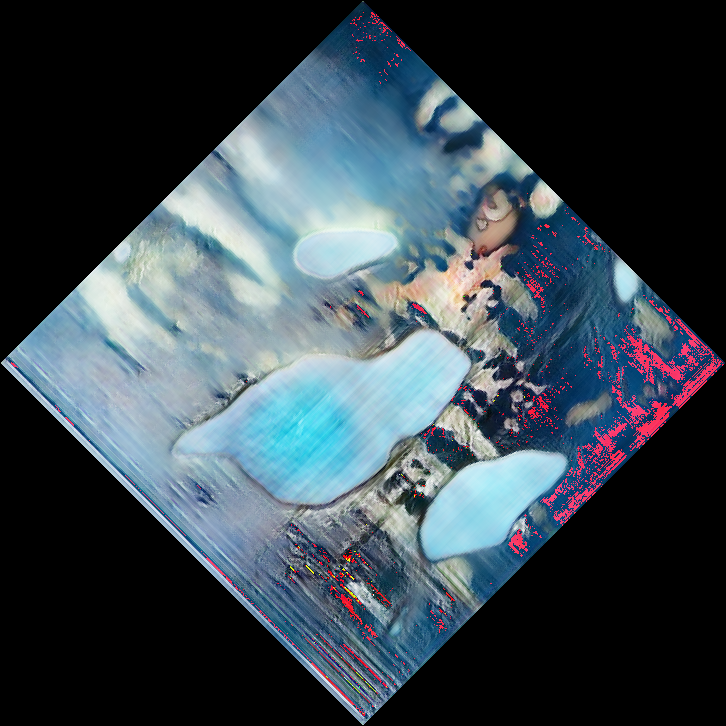

In [6]:
display(img.rotate(-45, expand=True))

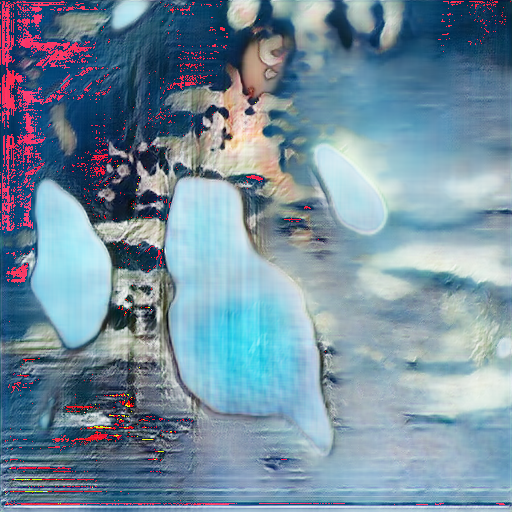

In [7]:
display(img.transpose(Image.FLIP_LEFT_RIGHT))

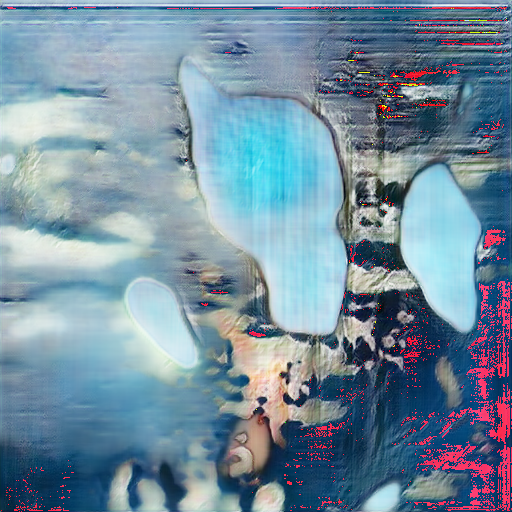

In [8]:
display(img.transpose(Image.FLIP_TOP_BOTTOM))

### Cropping

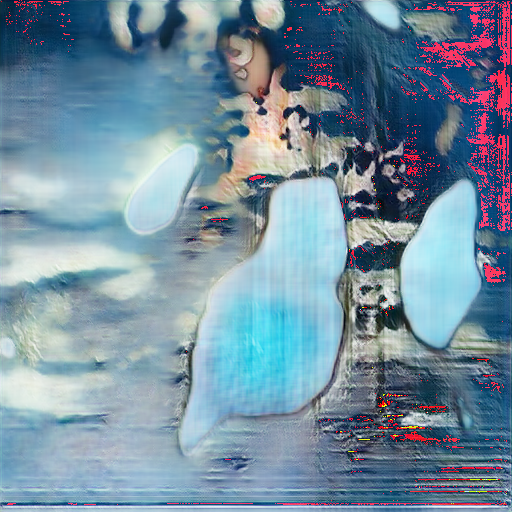

In [9]:
# Original image.
display(img)

In [10]:
# Cropped section.
display(img.crop((0, 0, 256, 12))) # Left, upper, right, lower pixel.

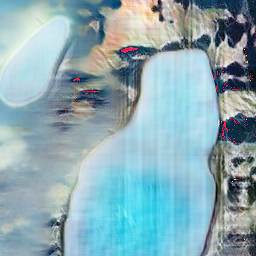

(256, 256)


In [11]:
# Crop to centered half size
img_width, img_height = img.size
c_width = img_width / 2
c_height = img_height /2
left = (img_width - c_width) / 2
upper = (img_height - c_height) / 2
right = left + c_width
lower = upper + c_height
img_crop = img.crop((left, upper, right, lower))
display(img_crop)
print(img_crop.size)

### Copy and Paste

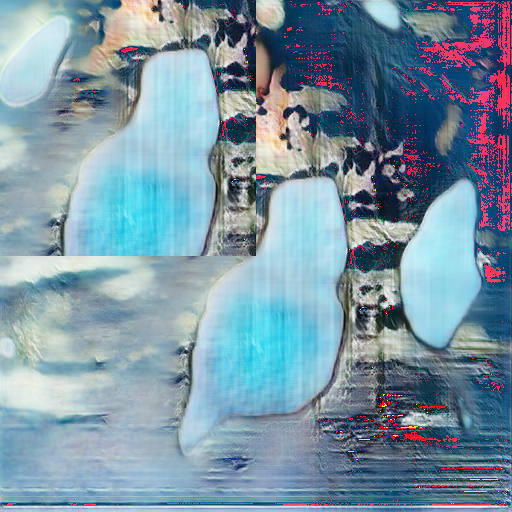

In [12]:
img_copy = img.copy()
img_copy.paste(img_crop, (0, 0))
display(img_copy)

steps: 32


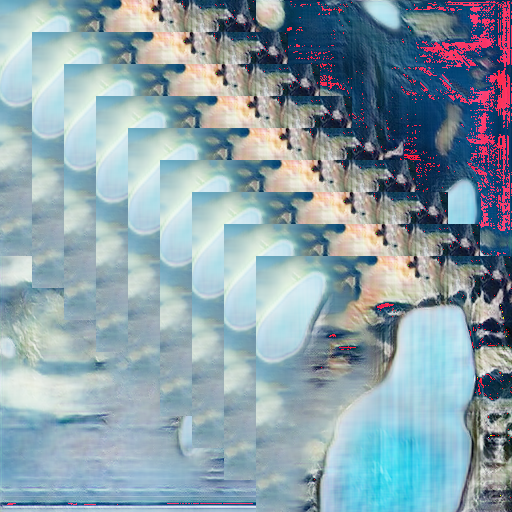

In [13]:
img_copy = img.copy()
i = 8
steps = (img.size[0] - img_crop.size[0]) / i
steps = int(steps)
print('steps:', steps)
for i in range(i+1):
    img_copy.paste(img_crop, (steps * i, steps * i))
display(img_copy)

### Export an image

In [14]:
import os, sys

img_flipped = img.transpose(Image.FLIP_LEFT_RIGHT)

img_flipped.save('images/Fig24_flipped.png')

## NumPy

[numpy.org](https://numpy.org/) – "The fundamental package for scientific computing with Python".

**Tutorials:**

[numpy.org Tutorials](https://numpy.org/learn/)

[W3Schools NumPy Tutorial](https://www.w3schools.com/python/numpy/default.asp)

In [15]:
import numpy as np

A numpy array has at least one dimension/ axis:

In [16]:
a = np.arange(12) # Creates a one-dimensional array with 12 values.
print(a)
print('dimensions:', a.ndim) # .ndim returns the number of dimension.

[ 0  1  2  3  4  5  6  7  8  9 10 11]
dimensions: 1


In [17]:
# Shape of the array:
print('shape:', a.shape)

shape: (12,)


We can **reshape** the array. Next we will shape it from one dimension to two dimensions, this could for e.g. be the height and width of an image.

In [18]:
a = a.reshape(4, 3)
print(a)

[[ 0  1  2]
 [ 3  4  5]
 [ 6  7  8]
 [ 9 10 11]]


In [19]:
print('dimensions:', a.ndim)
print('shape:', a.shape)
print('size', a.size) # Size (number of all items) of an array.

dimensions: 2
shape: (4, 3)
size 12


Note that the first dimension are rows (like the height of an image), the second are columns (like the width of an image).<br>
We can access elements of an array like we do it with lists.

In [20]:
print(a)
print('first row:', a[0]) # first row
print('second item of first row:', a[0][1]) # second item of first row

[[ 0  1  2]
 [ 3  4  5]
 [ 6  7  8]
 [ 9 10 11]]
first row: [0 1 2]
second item of first row: 1


If we want to extract the first column (<code>[0, 3, 6, 9]</code>), we can **transpose** the array, meaning permute its axis:

In [21]:
aT = a.T # .T transposes an ndarray.
print(aT)
print(aT[0])

[[ 0  3  6  9]
 [ 1  4  7 10]
 [ 2  5  8 11]]
[0 3 6 9]


We can create very high-dimensional arrays:

In [22]:
a = a.reshape(2, 2, -1)
# One shape dimension can be -1. In this case, the value is inferred 
# from the length of the array and remaining dimensions.
print(a)

[[[ 0  1  2]
  [ 3  4  5]]

 [[ 6  7  8]
  [ 9 10 11]]]


In [23]:
print('shape:', a.shape)
print('dimensions:', a.ndim)

shape: (2, 2, 3)
dimensions: 3


In [24]:
b = np.arange(96).reshape(2, 3, 2, 2, -1)
print(b)
print('shape:', b.shape)
print('dimensions:', b.ndim)

[[[[[ 0  1  2  3]
    [ 4  5  6  7]]

   [[ 8  9 10 11]
    [12 13 14 15]]]


  [[[16 17 18 19]
    [20 21 22 23]]

   [[24 25 26 27]
    [28 29 30 31]]]


  [[[32 33 34 35]
    [36 37 38 39]]

   [[40 41 42 43]
    [44 45 46 47]]]]



 [[[[48 49 50 51]
    [52 53 54 55]]

   [[56 57 58 59]
    [60 61 62 63]]]


  [[[64 65 66 67]
    [68 69 70 71]]

   [[72 73 74 75]
    [76 77 78 79]]]


  [[[80 81 82 83]
    [84 85 86 87]]

   [[88 89 90 91]
    [92 93 94 95]]]]]
shape: (2, 3, 2, 2, 4)
dimensions: 5


We can create arrays with random values.

In [25]:
# With new versions of numpy we create a generator object first:
from numpy.random import default_rng
rng = default_rng()
r = rng.standard_normal(12).reshape(4, 3)
print(r)

[[-0.67962429 -0.43086398 -1.53134683]
 [ 0.13032878  1.38690333  1.67278883]
 [ 0.09355579 -0.24259509  0.96659276]
 [-0.95727011 -0.35790294  0.83345163]]


In [26]:
# Random integers in a given scale:
r = rng.integers(low=4, high=10, size=12).reshape(4, -1)
print(r)

[[6 5 8]
 [9 5 9]
 [5 5 8]
 [6 8 4]]


## NumPy and Images

### Read an image as array

In [27]:
img_a = np.asarray(Image.open('images/Fig24.png'))
print('dimensions:', img_a.ndim)
print('shape:', img_a.shape)
print('size', img_a.size)

dimensions: 3
shape: (512, 512, 3)
size 786432


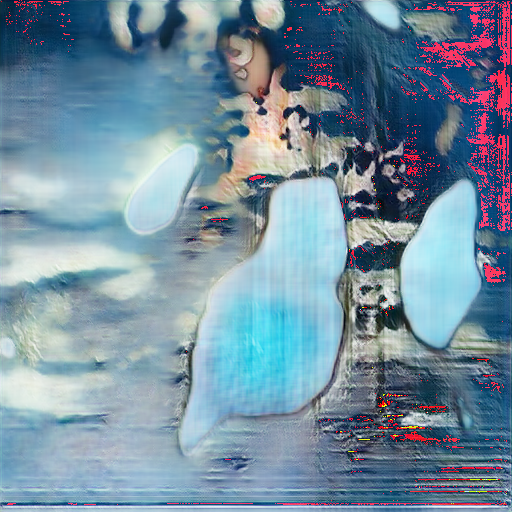

In [28]:
img = Image.fromarray(img_a)
display(img)

In [29]:
img_a

array([[[ 80, 109,  93],
        [ 39,  45,  76],
        [ 15,  26,  52],
        ...,
        [  5,  39,  77],
        [ 19,  56,  87],
        [  9,  39,  77]],

       [[ 28,  46,  71],
        [235,  10,  29],
        [ 16,  42,  62],
        ...,
        [245,  44,  79],
        [  8,  54,  91],
        [ 20,  66,  97]],

       [[ 17,  47,  57],
        [ 18,  48,  67],
        [ 19,  50,  69],
        ...,
        [  6,  64,  96],
        [ 11,  59,  98],
        [246,  32,  77]],

       ...,

       [[159, 179, 185],
        [164, 186, 193],
        [151, 173, 187],
        ...,
        [151, 180, 193],
        [154, 174, 192],
        [123, 153, 177]],

       [[170, 197, 193],
        [172, 203, 196],
        [173, 197, 201],
        ...,
        [150, 188, 188],
        [168, 188, 200],
        [121, 140, 171]],

       [[172, 191, 180],
        [171, 190, 200],
        [172, 188, 206],
        ...,
        [132, 180, 178],
        [152, 191, 187],
        [152, 194, 185]]

### Mapping rgb values to values between 0 and 1

When machines do computer vision, they work commonly with data that looks like the array above: a matrix of rgb-values between 0 and 1.

In [30]:
img_interpolated = np.interp(img_a, (0, 255), (0, 1))
img_interpolated

array([[[0.31372549, 0.42745098, 0.36470588],
        [0.15294118, 0.17647059, 0.29803922],
        [0.05882353, 0.10196078, 0.20392157],
        ...,
        [0.01960784, 0.15294118, 0.30196078],
        [0.0745098 , 0.21960784, 0.34117647],
        [0.03529412, 0.15294118, 0.30196078]],

       [[0.10980392, 0.18039216, 0.27843137],
        [0.92156863, 0.03921569, 0.11372549],
        [0.0627451 , 0.16470588, 0.24313725],
        ...,
        [0.96078431, 0.17254902, 0.30980392],
        [0.03137255, 0.21176471, 0.35686275],
        [0.07843137, 0.25882353, 0.38039216]],

       [[0.06666667, 0.18431373, 0.22352941],
        [0.07058824, 0.18823529, 0.2627451 ],
        [0.0745098 , 0.19607843, 0.27058824],
        ...,
        [0.02352941, 0.25098039, 0.37647059],
        [0.04313725, 0.23137255, 0.38431373],
        [0.96470588, 0.1254902 , 0.30196078]],

       ...,

       [[0.62352941, 0.70196078, 0.7254902 ],
        [0.64313725, 0.72941176, 0.75686275],
        [0.59215686, 0

### Map array from float to int

In order to display the array as an image, we've to map it back again from float to rgb-values as integers.

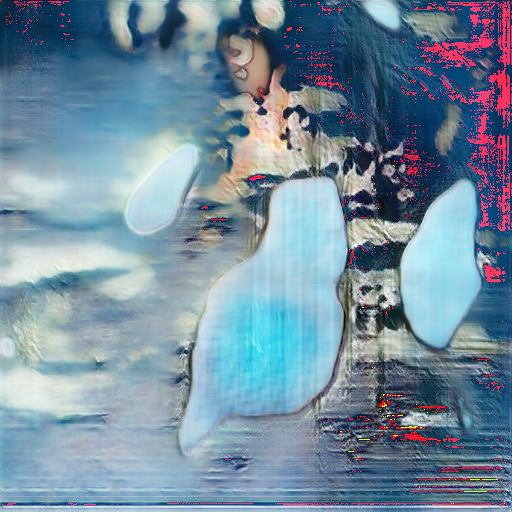

In [36]:
rgb_from_float = np.interp(img_interpolated, (0, 1), (0, 255))
rgb_from_float = rgb_from_float.astype(np.uint8)
display(Image.fromarray(rgb_from_float))

Task: Create a random image with numpy and PIL.

### Image manipulations with array manipulations

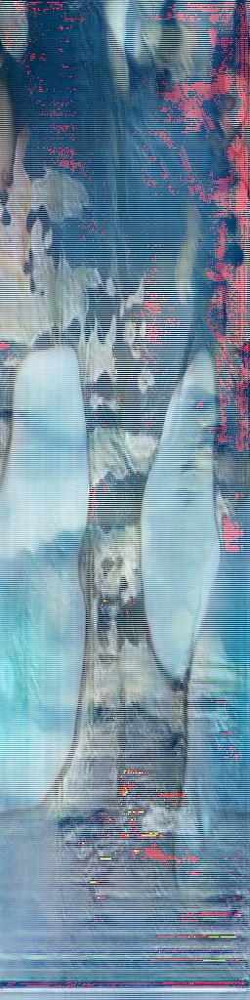

In [37]:
img = Image.fromarray(img_a.reshape(1024, -1, 3))
display(img)

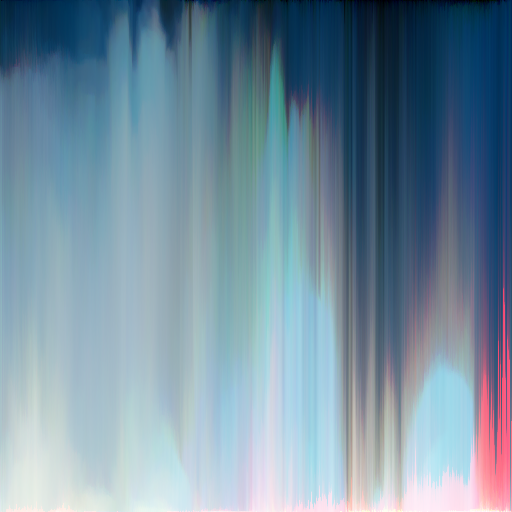

In [38]:
img = Image.fromarray(np.sort(img_a, axis=0))
display(img)

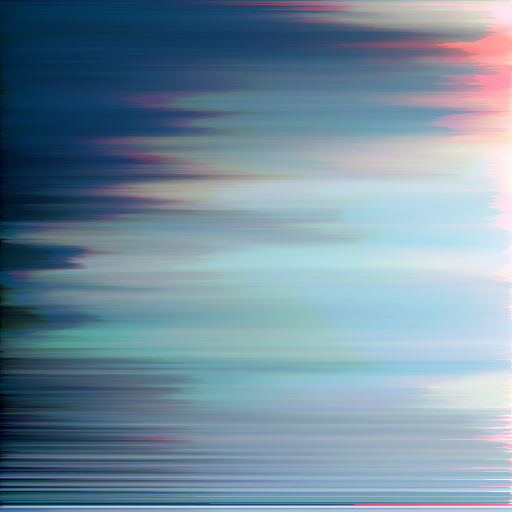

In [39]:
img = Image.fromarray(np.sort(img_a, axis=1))
display(img)

### Automating the sorting for a list of images

In [40]:
import os

files = os.listdir('img_orig')
for index, f in enumerate(files):
    files[index] = 'img_orig/' + f
print(files)

['img_orig/Fig24_[0.2135,-0.5872,-0.3551,0.9738,0.5914,-0.8306,-3.6004,-0.9331].png', 'img_orig/[0.5789,1.2842,-1.792,0.9627,-1.4277,0.0433,1.5592,-0.455].png', 'img_orig/Fig40_[-0.4437,0.6532,0.0657,-0.3719,-2.2033,1.7251,-0.6366,0.1083].png', 'img_orig/Fig35_[-0.0913,0.7389,-1.4813,-0.6843,1.2772,1.3928,1.5341,-0.9073].png']


In [41]:
i = files[0].rfind('/')
i

8

In [42]:
files[0][8:]

'/Fig24_[0.2135,-0.5872,-0.3551,0.9738,0.5914,-0.8306,-3.6004,-0.9331].png'

In [43]:
def sort_img_list(list_, axis=0, display=False, out_dir=''):
    from PIL import Image
    import numpy as np
    from IPython.display import display
    
    for f in list_:
        img_a = np.asarray(Image.open(f))
        out = Image.fromarray(np.sort(img_a, axis=axis))
        
        if display:
            display(out)
            
        if out_dir != '':
            # Reduce f to filename.
            f = f[f.rfind('/')+1:]
            out.save(out_dir+f)

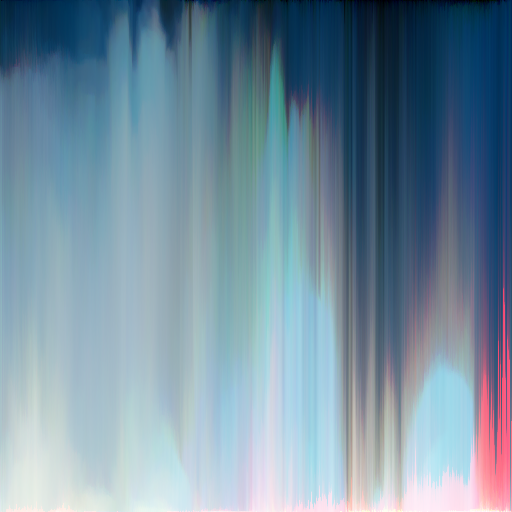

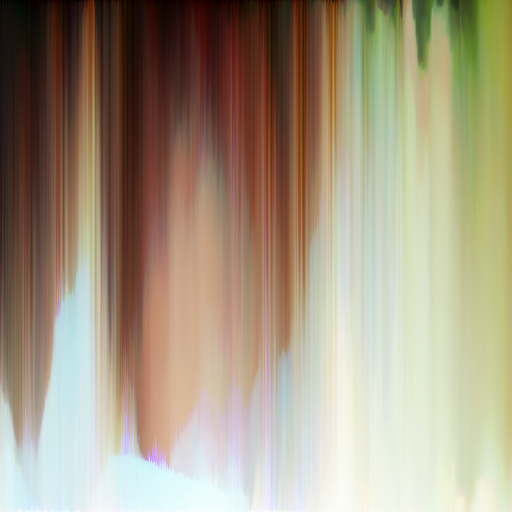

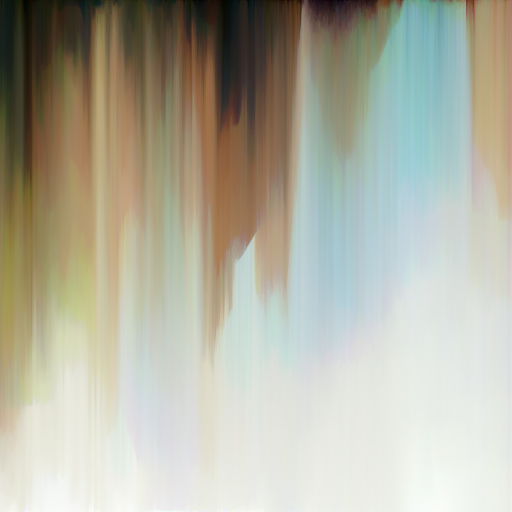

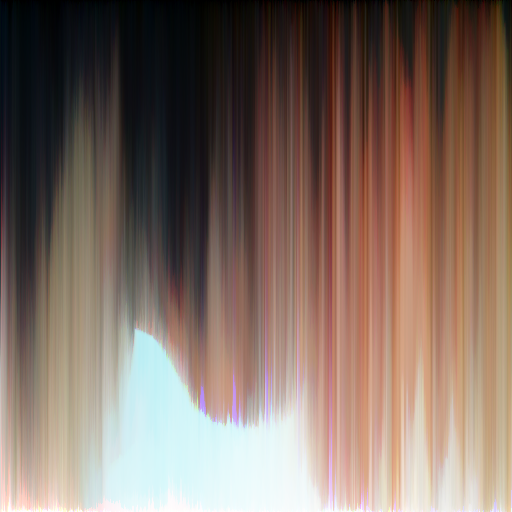

In [44]:
sort_img_list(files, display=True, out_dir='img_man/')

### Shuffle rows of an image

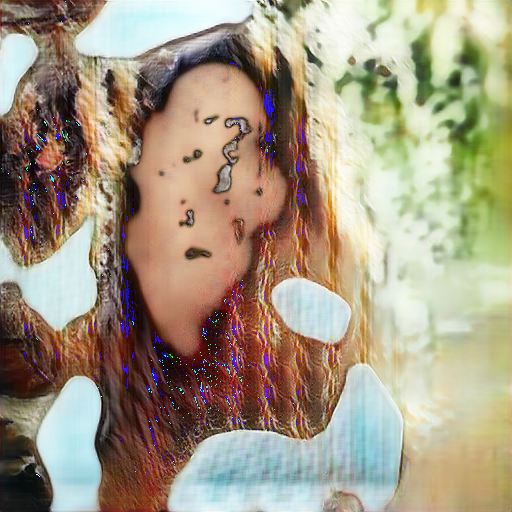

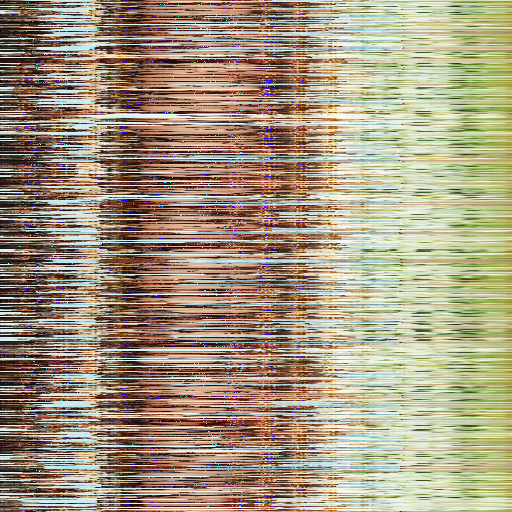

In [47]:
img = Image.open('img_orig/[0.5789,1.2842,-1.792,0.9627,-1.4277,0.0433,1.5592,-0.455].png')
display(img)
img_a = np.asarray(img)
np.random.shuffle(img_a)
display(Image.fromarray(img_a))

## Deepface

[Introduction at pypi.org](https://pypi.org/project/deepface/)

In [50]:
from deepface import DeepFace

In [53]:
img_path = 'img_orig/[0.5789,1.2842,-1.792,0.9627,-1.4277,0.0433,1.5592,-0.455].png'

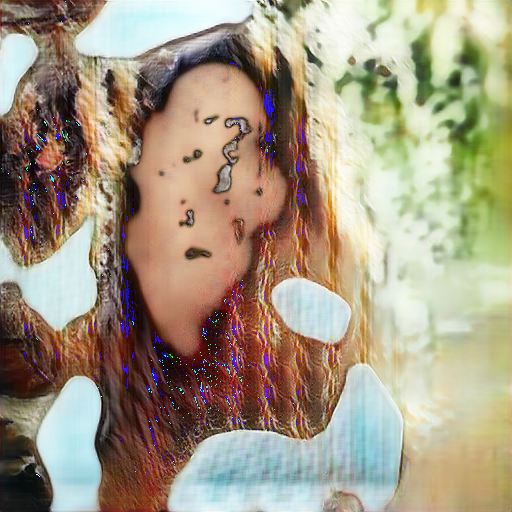

In [54]:
img = Image.open(img_path)
display(img)

In [55]:
obj = DeepFace.analyze(img_path = img_path, actions = ['age', 'emotion'])

Action: emotion: 100%|████████████████████████████| 2/2 [00:00<00:00,  2.70it/s]


In [56]:
type(obj)

dict

In [57]:
obj

{'age': 25,
 'region': {'x': 119, 'y': 210, 'w': 116, 'h': 116},
 'emotion': {'angry': 0.0031990877775164486,
  'disgust': 1.0905618455593358e-12,
  'fear': 1.4570451314638465e-05,
  'happy': 0.00023952965484369583,
  'sad': 0.23165334931184944,
  'surprise': 1.0330410920699988e-05,
  'neutral': 99.76488350420496},
 'dominant_emotion': 'neutral'}

### Draw a rect around the detected face

In [58]:
# We can access elements of a dictionary with the syntax:
# Name_of_object["key in apostrophes"]
region = obj['region']
print(region)

{'x': 119, 'y': 210, 'w': 116, 'h': 116}


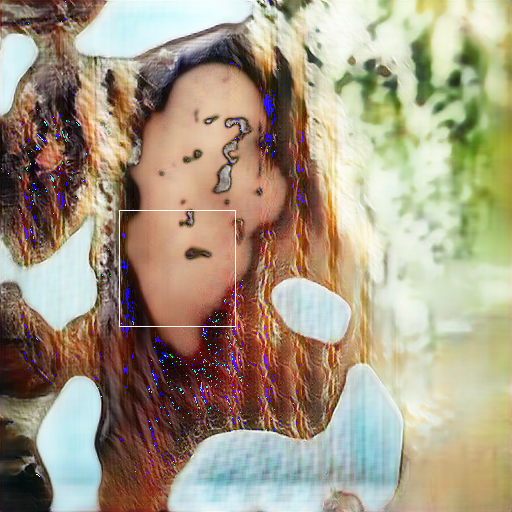

In [59]:

from PIL import ImageDraw
img_face_region = Image.open(img_path)
draw = ImageDraw.Draw(img_face_region)
# Rectangle format: (left, top, right, bottom)
left = region['x']
top = region['y']
right = left + region['w']
bottom = top + region['h']
draw.rectangle((left, top, right, bottom))
display(img_face_region)

### Crop face

In [67]:
def crop_face(img_path):
    ''' Returns the part of an image which contains a face. '''
    obj = DeepFace.analyze(img_path = img_path, actions = ['age'])
    region = obj['region']
    print(region)
    left = region['x']
    upper = region['y']
    right = left + region['w']
    lower = upper + region['h']
    img = Image.open(img_path)
    img = img.crop((left, upper, right, lower))
    return img

Action: emotion: 100%|████████████████████████████| 2/2 [00:00<00:00,  4.30it/s]

{'x': 142, 'y': 100, 'w': 140, 'h': 140}


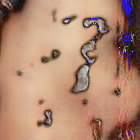

In [68]:
img_path = 'img_orig/[0.5789,1.2842,-1.792,0.9627,-1.4277,0.0433,1.5592,-0.455].png'
img_face = crop_face(img_path)
display(img_face)

## Resize an image with PIL

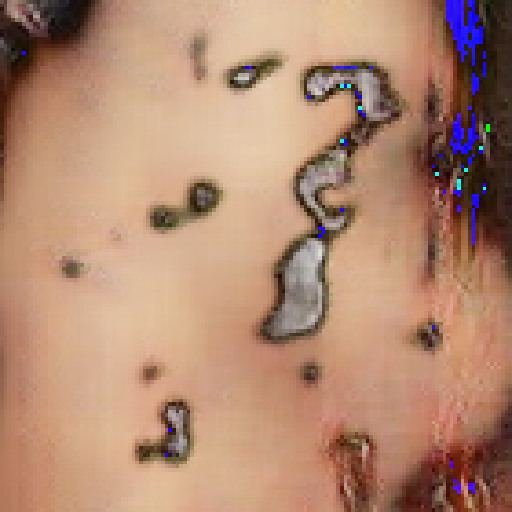

nearest 




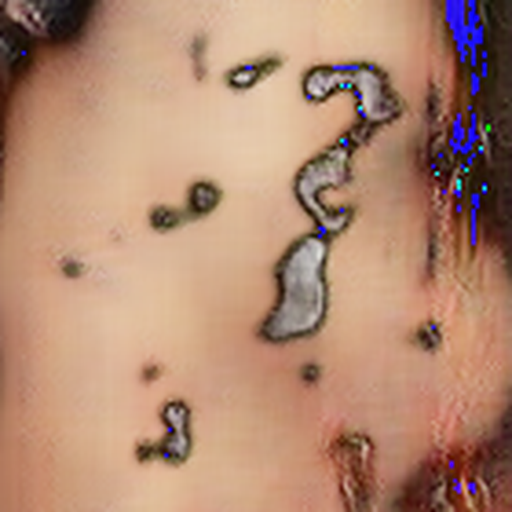

lanczos 




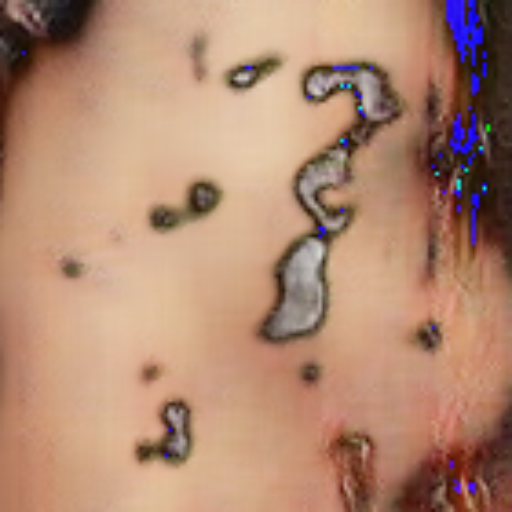

bilinear 




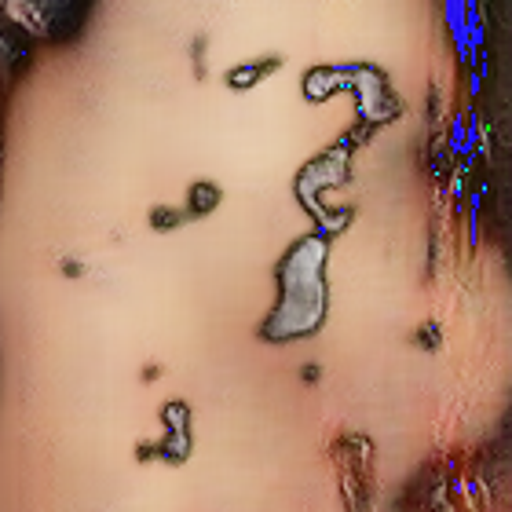

bicubic 




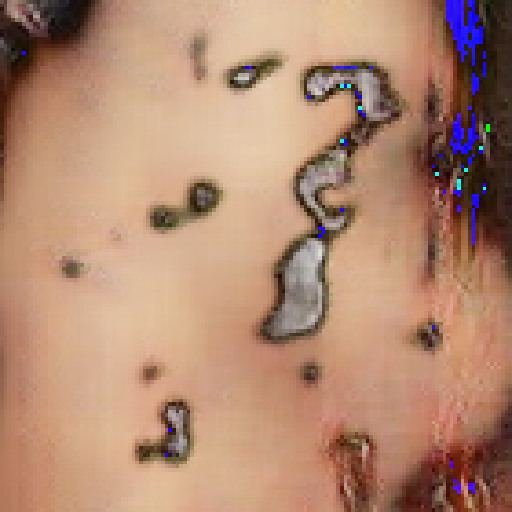

box 




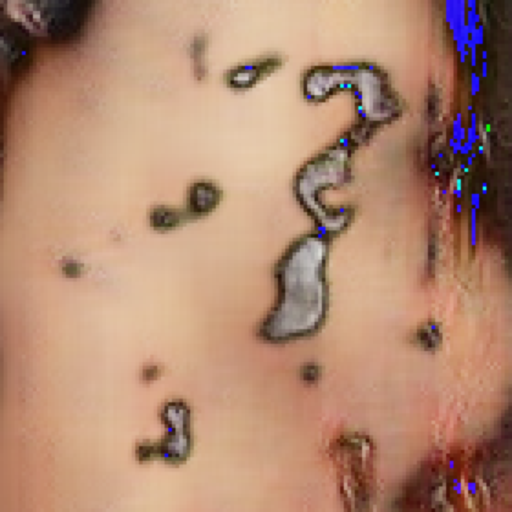

hamming 




In [74]:
# Methods for scaling:
sampling = [Image.NEAREST, Image.LANCZOS, Image.BILINEAR, Image.BICUBIC, Image.BOX, Image.HAMMING]
names = ['nearest', 'lanczos', 'bilinear', 'bicubic', 'box', 'hamming']
for i, method in enumerate(sampling):
    display(img_face.resize((512, 512), method))
    print(names[i], '\n'*2)